Examine your individual flat field images for the V filter. Are there significant artifacts?
How might we combine the frames into a master flat field frame to get rid of these
artifacts? Compare the average light levels in your V flats and say how this will impact
your combine strategy (hint: you will want to scale your flat field images to a common
level, and then combine using some weighting to account for the fact that some flats have
higher signal than others–it world be inappropriate to give them all equal weight). After
scaling to a common mean, discuss the advantages and disadvantages of making a master
flat field image from:
• A straight average of all V flat frames
• A straight median of all V flat frames
• An average where outlier pixels are rejected if they are more than 3  from the mean
• An average where outlier pixels are rejected and the weighted mean is obtained by
weighting each image by the mean counts in the original image. This way, bright
flats field exposures with higher count rates are given more weight than flats with
low light levels.
Which of these strategies, if any, is the best? Or is some combination the right approach?
Show plots and metrics like RMS to defend your conclusions.

In [1]:
#import packages 

from astropy.modeling import models, fitting
import scipy.optimize
import numpy as np
from astropy.io import fits
from astropy import stats
from matplotlib import pyplot as plt
from matplotlib import rc
import matplotlib as mpl
%matplotlib inline
from astropy.visualization import hist
from tempfile import mkdtemp
from pathlib import Path
from ccdproc import ImageFileCollection, Combiner, combine
import ccdproc as ccdp
from astropy.modeling import fitting
from astropy.modeling.models import Polynomial1D,Chebyshev1D,Legendre1D,Hermite1D
from astropy.nddata import CCDData
import glob
from datetime import datetime
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import glob
import sys
from astropy.stats import sigma_clip

path_dir = '/Users/mcgowkb1/ASTR8060/astr_8060_f23/software/ccd-reduction-and-photometry-guide/ccd-reduction-and-photometry-guide/notebooks/'
# Data Directory for Images folder

data_dir = '/Users/mcgowkb1/ASTR8060/Imaging/' #raw data 
reduced_dir = '/Users/mcgowkb1/ASTR8060/astr_8060_f23/reduced_data/10102023/' #processed data
sys.path.insert(0,path_dir)
from convenience_functions import show_image

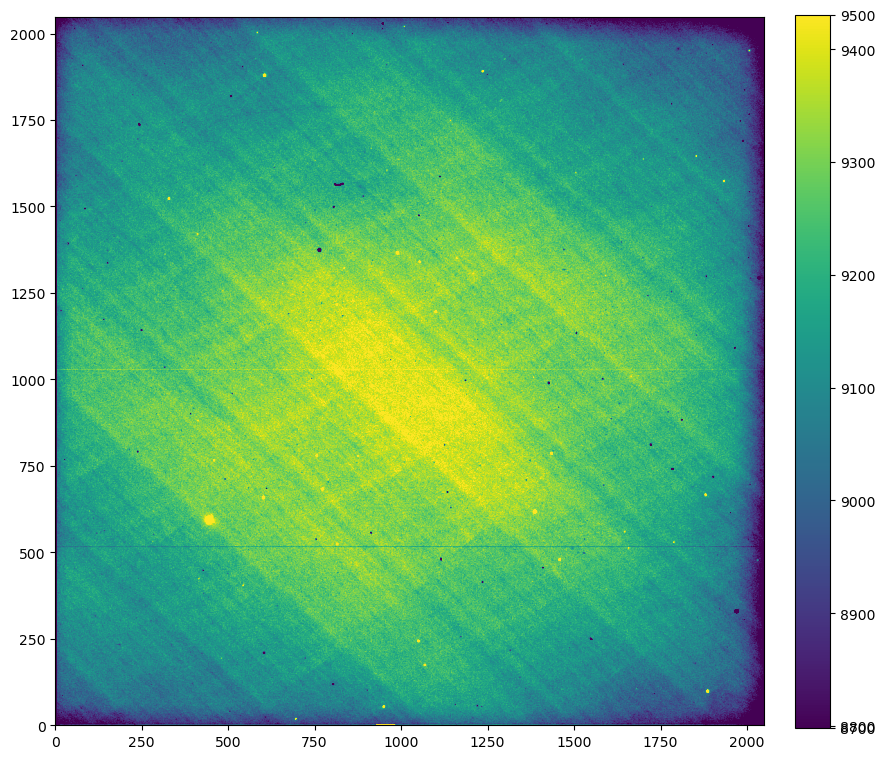

In [2]:
# Flat Field images for V filter (a043-a049)
hdu = fits.open(reduced_dir + 'otz_a043.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

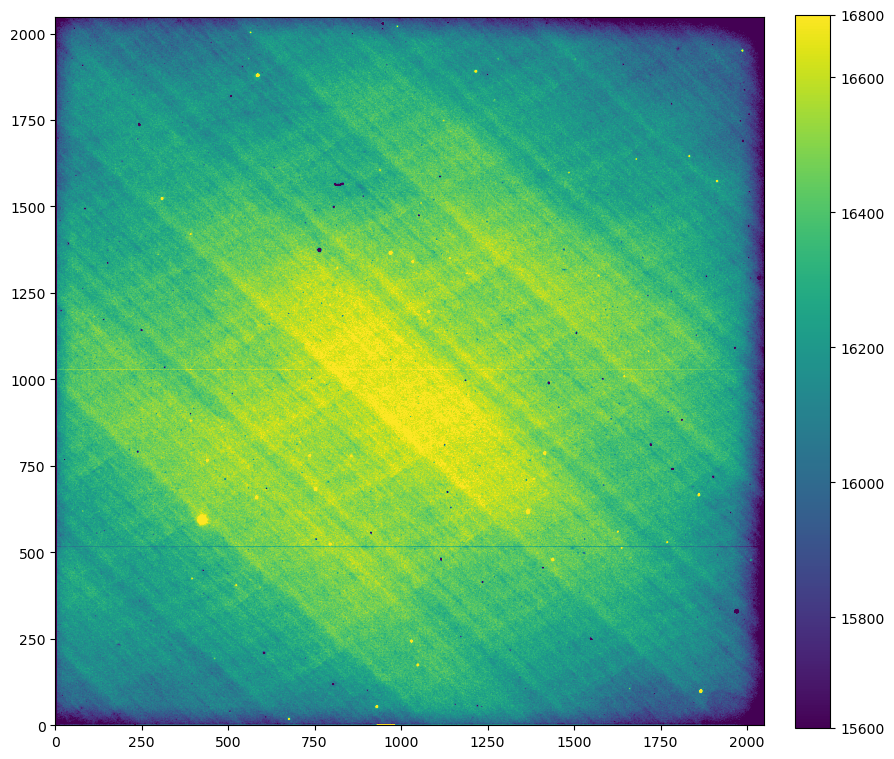

In [3]:
hdu = fits.open(reduced_dir + 'otz_a044.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

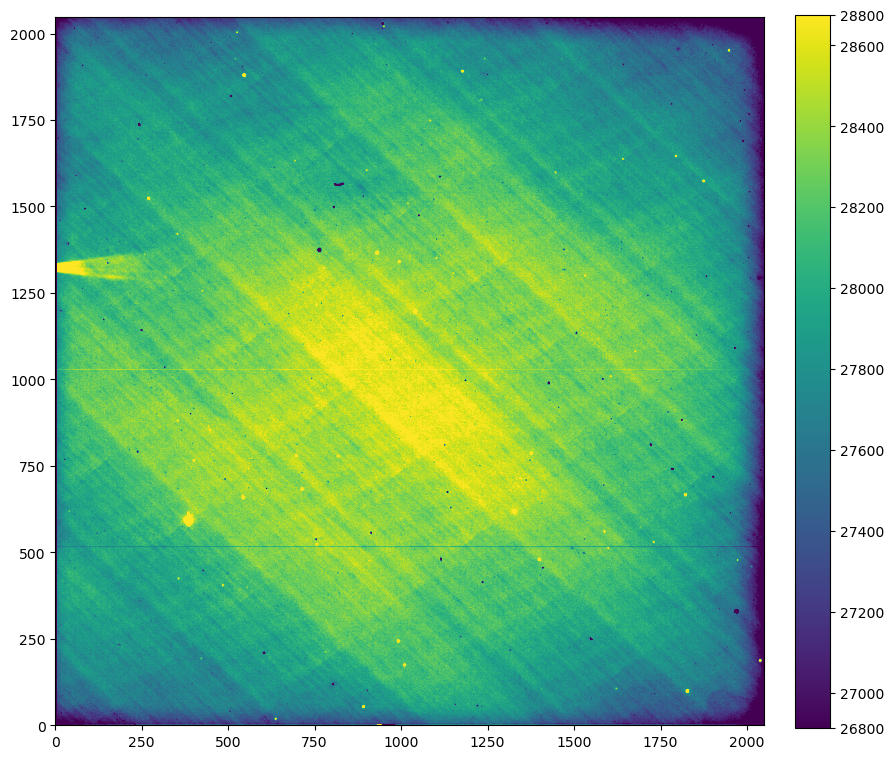

In [4]:
hdu = fits.open(reduced_dir + 'otz_a045.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

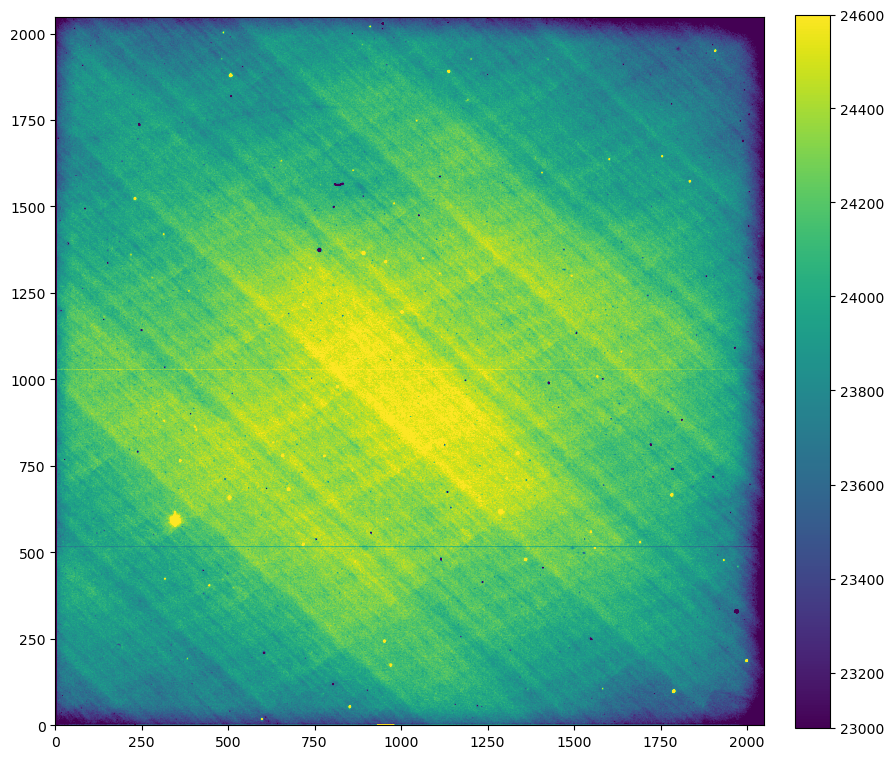

In [5]:
hdu = fits.open(reduced_dir + 'otz_a046.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

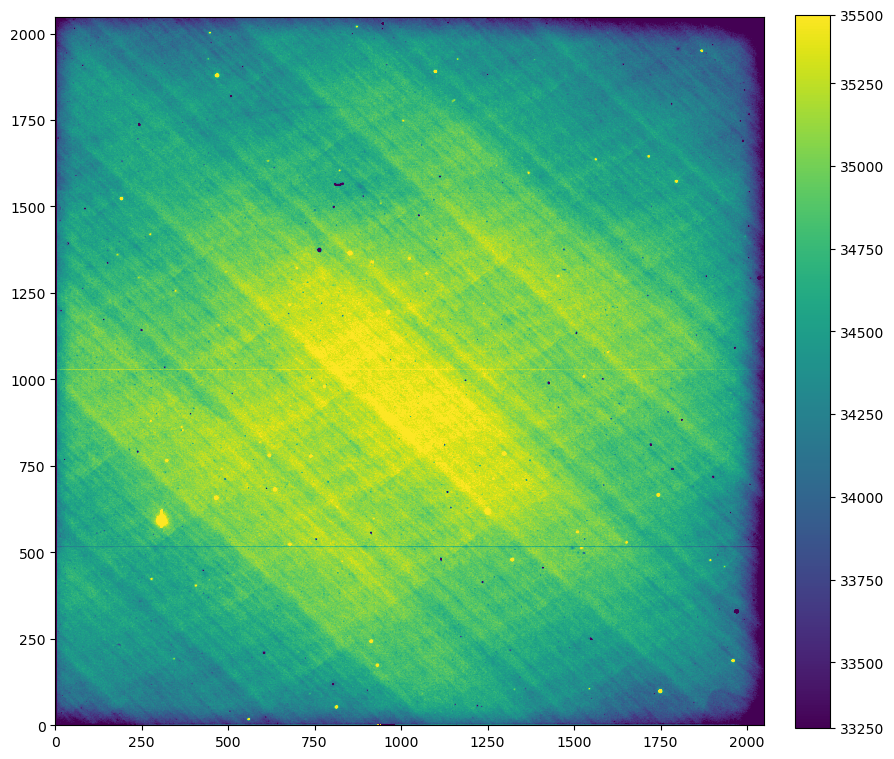

In [6]:
hdu = fits.open(reduced_dir + 'otz_a047.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

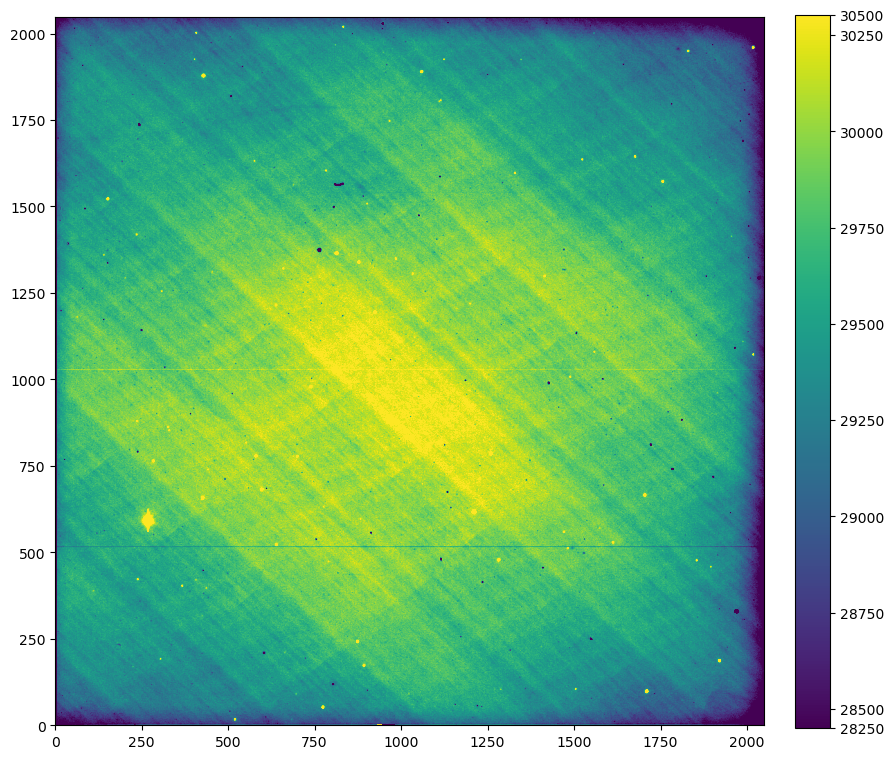

In [7]:
hdu = fits.open(reduced_dir + 'otz_a048.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

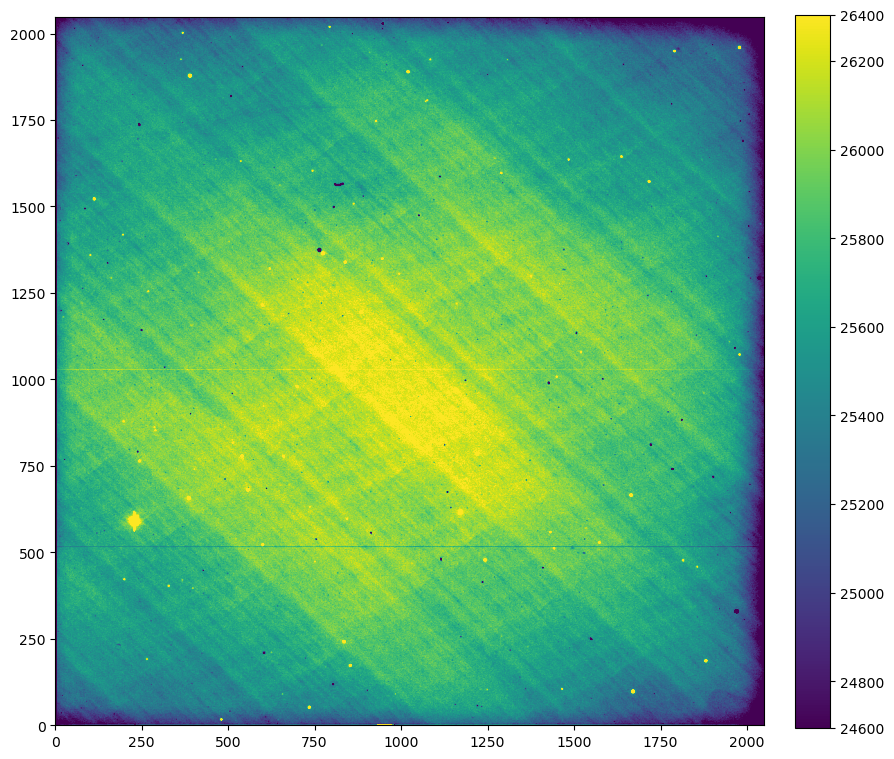

In [8]:
hdu = fits.open(reduced_dir + 'otz_a049.fits')
img = hdu[0].data
np.shape(img)
#section = img[:,50:2048]
show_image(img)# before subtraction 
#show_image(section)# after subtraction

Significant speckles can be seen across multiple flats in the same location. We can create a master flat by combining these images to make a "mask" that mimics the imperfections that want will subtract. It appears that the flats do have different average light levels. The highest being around 35500 and the lowest 9500. We will scale the images to 1 before determining a weight to use. 

discuss the advantages and disadvantages of making a master flat field image from:
- A straight average of all V flat frames
- A straight median of all V flat frames
- An average where outlier pixels are rejected if they are more than 3  from the mean
- An average where outlier pixels are rejected and the weighted mean is obtained by weighting each image by the mean counts in the original image. This way, bright flats field exposures with higher count rates are given more weight than flats withlow light levels. 
- Which of these strategies, if any, is the best? Or is some combination the right approach?
- Show plots and metrics like RMS to defend your conclusions.



### Straight Average of all V Flat Frames
**Advantages:**
- Simple and straightforward.
- Provides an overall representation of the flat frames.

**Disadvantages:**
- Susceptible to being affected by extreme values, outliers, or cosmic ray hits, leading to a less accurate representation of the flat field.

### Straight Median of all V Flat Frames
**Advantages:**
- Robust against outliers and extreme values.
- Less affected by cosmic ray hits or hot/cold pixels.
- Provides a more accurate representation of the true flat field by ignoring extreme values.

**Disadvantages:**
- Ignores pixel variations present in individual frames, potentially underestimating the true variance.

### Average with Outlier Rejection (e.g., Sigma Clipping)
**Advantages:**
- Robust against outliers and cosmic ray hits.
- Provides a more accurate representation of the true flat field by rejecting extreme values.

**Disadvantages:**
- Might overly reject valid data points if the rejection threshold is set too conservatively.
- Complexity increases due to the need for setting a rejection threshold.

### Weighted Average by Mean Counts in Original Image
**Advantages:**
- Accounts for variations in signal levels among different frames.
- Gives more weight to frames with higher counts, potentially representing the flat field better.

**Disadvantages:**
- Sensitive to the accuracy of the mean counts in original images.
- Requires reliable estimation of the mean counts in each frame.

### Best Strategy
The "best" strategy depends on the specific characteristics of the dataset and the level of accuracy desired. In general:
- **Straight median** is a good choice due to its robustness against outliers and its ability to provide a cleaner representation of the true flat field.
- **Weighted average** can be useful when there's a significant variation in signal levels, giving more weight to frames with higher counts, thereby potentially improving the accuracy of the master flat.

### Combination Approach
A combination of methods might be the best approach. For instance, combining the straight median with weighted averaging can benefit from the benefits of the median while accounting for signal level variations.

### Analysis with Plots and Metrics
To defend conclusions, plots showing the flat field images using different methods along with metrics like Root Mean Square (RMS) can be beneficial. RMS helps quantify differences between the master flat images, showcasing the level of noise or variation present in each method's output. This visual and quantitative analysis will support the evaluation of which method better represents the true flat field and guide the selection of the most suitable strategy for the given dataset.

In [88]:
# generally 
import numpy as np
from astropy.io import fits
from astropy.stats import sigma_clip
import matplotlib.pyplot as plt

# Load processed master flat field images for each method
image_straight_avg = fits.getdata('straight_avg_master_flat.fits')
image_straight_median = fits.getdata('straight_median_master_flat.fits')
image_sigma_clip = fits.getdata('sigma_clip_master_flat.fits')
image_weighted_avg = fits.getdata('weighted_avg_master_flat.fits')

# Calculate RMS for each image
rms_straight_avg = np.sqrt(np.mean((image_straight_avg - np.mean(image_straight_avg))**2))
rms_straight_median = np.sqrt(np.mean((image_straight_median - np.mean(image_straight_median))**2))
rms_sigma_clip = np.sqrt(np.mean((image_sigma_clip - np.mean(image_sigma_clip))**2))
rms_weighted_avg = np.sqrt(np.mean((image_weighted_avg - np.mean(image_weighted_avg))**2))

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

axs[0, 0].imshow(image_straight_avg, cmap='gray')
axs[0, 0].set_title(f'Straight Average (RMS: {rms_straight_avg:.4f})')

axs[0, 1].imshow(image_straight_median, cmap='gray')
axs[0, 1].set_title(f'Straight Median (RMS: {rms_straight_median:.4f})')

axs[1, 0].imshow(image_sigma_clip, cmap='gray')
axs[1, 0].set_title(f'Sigma Clip (RMS: {rms_sigma_clip:.4f})')

axs[1, 1].imshow(image_weighted_avg, cmap='gray')
axs[1, 1].set_title(f'Weighted Average (RMS: {rms_weighted_avg:.4f})')

plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'straight_avg_master_flat.fits'

In [30]:
# import block
import numpy as np
from astropy.io import fits
from matplotlib import pyplot as plt
from matplotlib import rc
%matplotlib inline
from astropy.visualization import hist
from ccdproc import ImageFileCollection
import ccdproc as ccdp
from astropy.modeling import fitting
from astropy.modeling.models import Polynomial1D,Chebyshev1D,Legendre1D,Hermite1D
from astropy.nddata import CCDData
from datetime import datetime
from astropy.stats import sigma_clip
#scaling the flats to 1 
#flat images(a043-a049)
# ID for flats a043-a049
flat_scaling = {}
flat_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(43,50)]
print(flat_id)

def inv_median(x):
    return 1./np.median(x)

def inv_mean(x):
    return 1./np.mean(x)

#def inv_mode(x):
#    return 1./stats.mode(x,axis=None)[0][0]

for ids in flat_id:
    hdu = fits.open(reduced_dir + ids)
    img = hdu[0].data
    mean = inv_mean(img)
    median = inv_median(img)
    #mode = inv_mode(img)
    flat_scaling[ids] = (mean,median)
    
    
    

['otz_a043.fits', 'otz_a044.fits', 'otz_a045.fits', 'otz_a046.fits', 'otz_a047.fits', 'otz_a048.fits', 'otz_a049.fits']


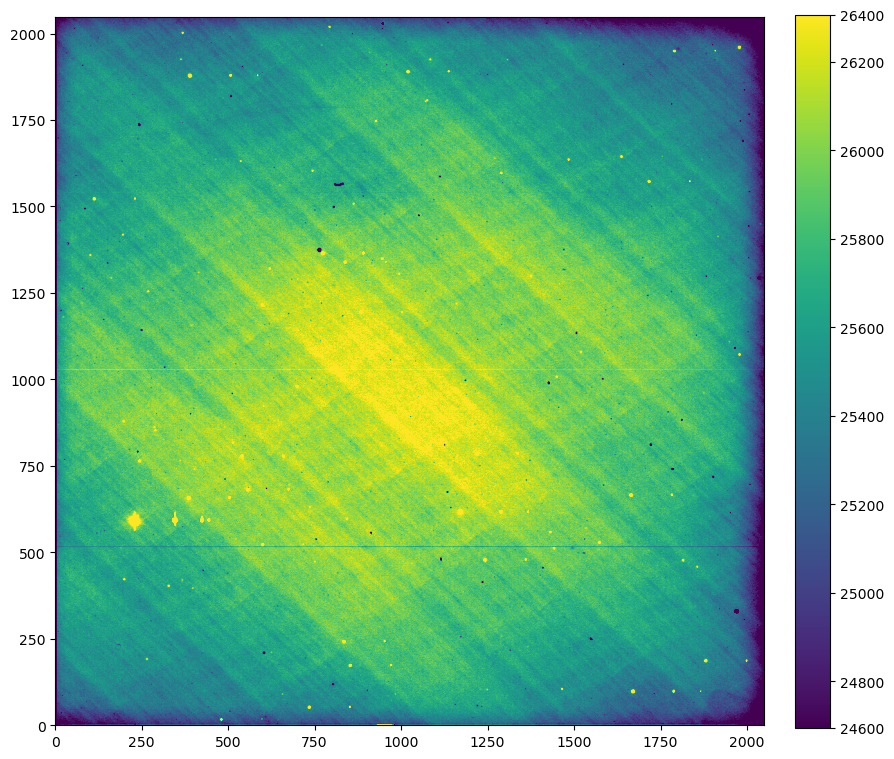

In [39]:
import numpy as np
from astropy.io import fits
import astropy.units as u
import ccdproc

# Initialize an empty list to store the CCDData objects and their normalized versions
ccd_list = []
normalized_list = []

# Read and append CCDData objects for each flat image
for filename in flat_id:
    ccd = fits.open(reduced_dir + filename)
    ccd_data = ccdproc.CCDData(data=ccd[0].data * u.adu, meta=ccd[0].header, unit='adu')
    ccd_list.append(ccd_data)
    
    # Normalize the data and store the normalized CCDData objects
    normalized_data = ccd_data.data / np.mean(ccd_data.data)
    normalized_ccd_data = ccdproc.CCDData(data=normalized_data, meta=ccd[0].header, unit='')
    normalized_list.append(normalized_ccd_data)
    
    ccd.close()

# Calculate weights based on the normalized flat images
weights = np.array([1.0 / np.std(normalized_ccd_data.data) ** 2 for normalized_ccd_data in normalized_list])

# Set the weights in the Combiner object
combiner = ccdproc.Combiner(ccd_list)
combiner.weights = weights

# Combine the flat images with weighted median
combined_flat = combiner.median_combine()

# Save the combined flat to a new FITS file
fits.writeto(reduced_dir + 'master_flat.fits', combined_flat.data, overwrite=True)
show_image(combined_flat)

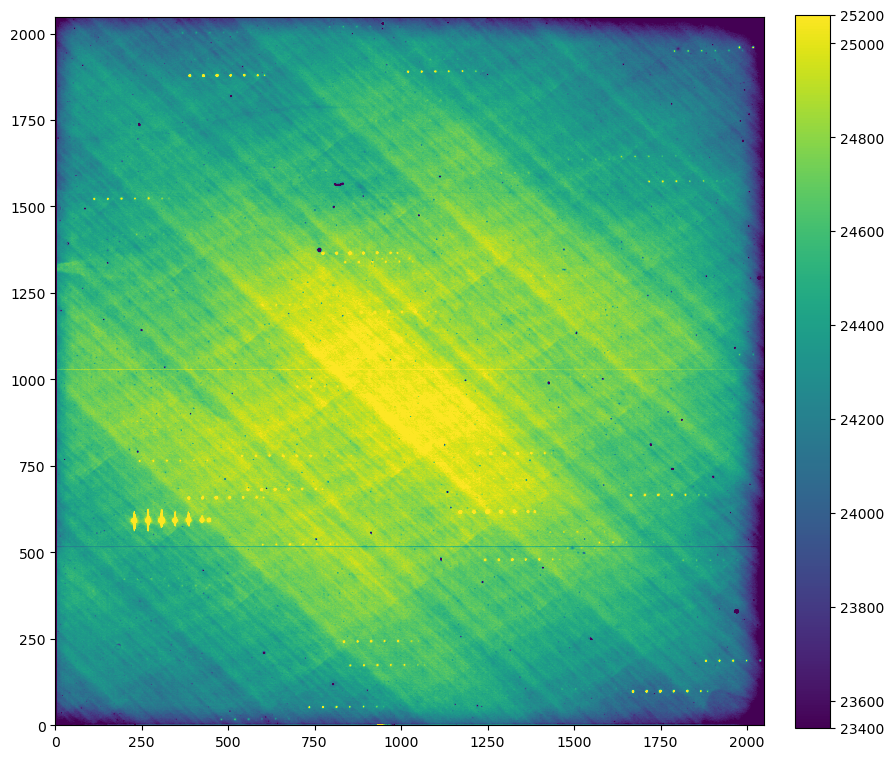

In [40]:
import numpy as np
from astropy.io import fits
import astropy.units as u
import ccdproc

# Initialize an empty list to store the CCDData objects and their normalized versions
ccd_list = []
normalized_list = []

# Read and append CCDData objects for each flat image
for filename in flat_id:
    ccd = fits.open(reduced_dir + filename)
    ccd_data = ccdproc.CCDData(data=ccd[0].data * u.adu, meta=ccd[0].header, unit='adu')
    ccd_list.append(ccd_data)
    
    # Normalize the data and store the normalized CCDData objects
    normalized_data = ccd_data.data / np.mean(ccd_data.data)
    normalized_ccd_data = ccdproc.CCDData(data=normalized_data, meta=ccd[0].header, unit='')
    normalized_list.append(normalized_ccd_data)
    
    ccd.close()

# Calculate weights based on the normalized flat images
weights = np.array([1.0 / np.std(normalized_ccd_data.data) ** 2 for normalized_ccd_data in normalized_list])

# Set the weights in the Combiner object
combiner = ccdproc.Combiner(ccd_list)
combiner.weights = weights

# Combine the flat images with weighted median
combined_flat = combiner.average_combine()

# Save the combined flat to a new FITS file
fits.writeto(reduced_dir + 'master_flat.fits', combined_flat.data, overwrite=True)
show_image(combined_flat)

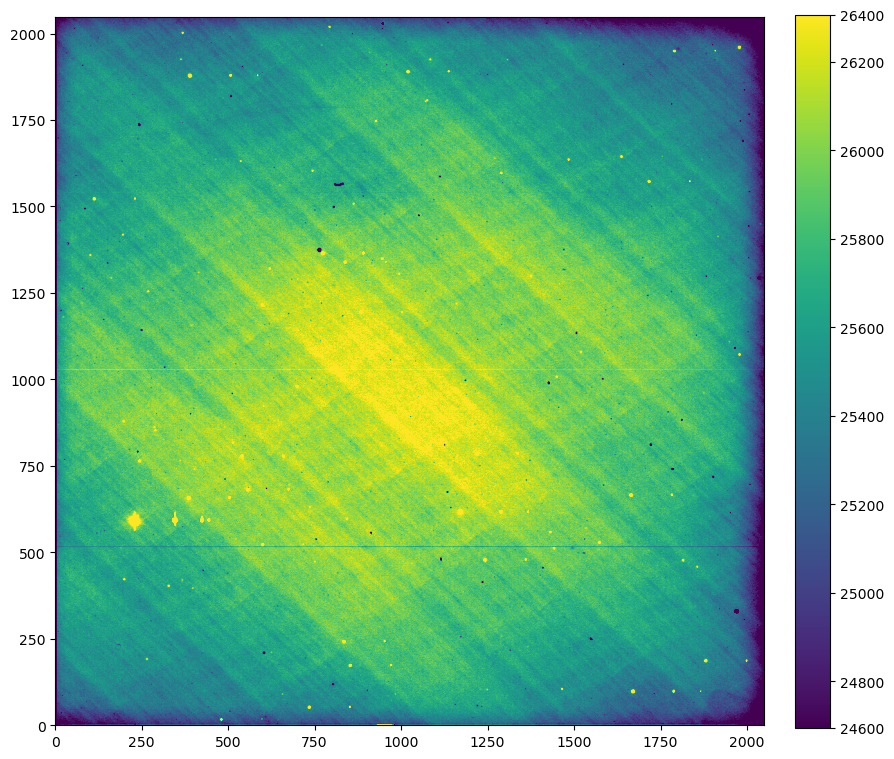

In [81]:
import numpy as np
from astropy.io import fits
import astropy.units as u
import ccdproc
from astropy.stats import sigma_clip


# Initialize an empty list to store the CCDData objects and their normalized versions
ccd_list = []
normalized_list = []

# Read and append CCDData objects for each flat image
for filename in flat_id:
    ccd = fits.open(reduced_dir + filename)
    ccd_data = ccdproc.CCDData(data=ccd[0].data * u.adu, meta=ccd[0].header, unit='adu')
    ccd_list.append(ccd_data)
    
    # Normalize the data and store the normalized CCDData objects
    normalized_V= ccd_data.data / np.mean(ccd_data.data)
    normalized_ccd_data = ccdproc.CCDData(data=normalized_V, meta=ccd[0].header, unit='')
    normalized_list.append(normalized_ccd_data)
    
    ccd.close()

# Calculate weights based on the normalized flat images
weights = np.array([1.0 / np.std(normalized_ccd_data.data) ** 2 for normalized_ccd_data in normalized_list])

# Set the weights in the Combiner object
combiner = ccdproc.Combiner(ccd_list)
combiner.weights = weights

# Combine the data with sigma clipping
combined_data = sigma_clip(combiner.data_arr, sigma=3, masked=True).data

# Convert the clipped data to CCDData objects
clipped_ccd_data = [ccdproc.CCDData(data=data, unit='', meta={}) for data in combined_data]

# Combine the clipped data with CCDProc
combined_flat = ccdproc.combine(clipped_ccd_data, method='median')
V_combined_flat = combined_flat
# Save the combined flat to a new FITS file
fits.writeto(reduced_dir + 'V_master_flat.fits', combined_flat.data, overwrite=True)

# Display the image (if show_image is a function you have defined)
show_image(combined_flat)


In [57]:
#import ccdproc as ccdp
#Filters U,V,B,I,R 
# just read in the bias-subtracted images
#imgs = ccdp.ImageFileCollection(reduced_dir,glob_include='*otz.fits') 

# get filenames for the U-band flats only
#U_flat_files = imgs.files_filtered(imagetyp='skyflat',filter='U',include_path=True) 

# or filter on the ImageFileCollection directly
#U_flat_imgs  = imgs.filter(imagetyp='skyflat',filter='V') 
#U_flat_imgs.summary

In [58]:
#H_Alpha a005-20
halpha_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(5,21)]
print(halpha_id)

['otz_a005.fits', 'otz_a006.fits', 'otz_a007.fits', 'otz_a008.fits', 'otz_a009.fits', 'otz_a010.fits', 'otz_a011.fits', 'otz_a012.fits', 'otz_a013.fits', 'otz_a014.fits', 'otz_a015.fits', 'otz_a016.fits', 'otz_a017.fits', 'otz_a018.fits', 'otz_a019.fits', 'otz_a020.fits']


In [59]:
#U a021-a028
U_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(21,29)]
print(U_id)

['otz_a021.fits', 'otz_a022.fits', 'otz_a023.fits', 'otz_a024.fits', 'otz_a025.fits', 'otz_a026.fits', 'otz_a027.fits', 'otz_a028.fits']


In [60]:
#B a029-a042
B_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(29,43)]
print(B_id)

['otz_a029.fits', 'otz_a030.fits', 'otz_a031.fits', 'otz_a032.fits', 'otz_a033.fits', 'otz_a034.fits', 'otz_a035.fits', 'otz_a036.fits', 'otz_a037.fits', 'otz_a038.fits', 'otz_a039.fits', 'otz_a040.fits', 'otz_a041.fits', 'otz_a042.fits']


In [76]:
#R a050-a055
R_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(50,56)]
print(R_id)

['otz_a050.fits', 'otz_a051.fits', 'otz_a052.fits', 'otz_a053.fits', 'otz_a054.fits', 'otz_a055.fits']


In [62]:
#I a057-a062
I_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(57,63)]
print(R_id)

['otz_a050.fits', 'otz_a051.fits', 'otz_a052.fits', 'otz_a053.fits', 'otz_a054.fits', 'otz_a055.fits']


Combine your flat field images to make a master flat for all filters using the strategy that
you arrived at above.

Normalize your master flat field image for each filter so that it has a mean of 1 (i.e., find
the mean in the image and divide by that mean) This way, when you divide your images
by your master flat field image, you don’t lose track of your photon statistics.

In [77]:
import numpy as np
from astropy.io import fits
import astropy.units as u
import ccdproc
from astropy.stats import sigma_clip


def combine_flats(flat_id):
    # Initialize empty lists to store CCDData objects and their normalized versions
    ccd_list = []
    normalized_list = []

    # Read and append CCDData objects for each flat image
    for filename in flat_id:
        ccd = fits.open(reduced_dir + filename)
        ccd_data = ccdproc.CCDData(data=ccd[0].data * u.adu, meta=ccd[0].header, unit='adu')
        ccd_list.append(ccd_data)
        
        # Normalize the data and store the normalized CCDData objects
        normalized_data = ccd_data.data / np.mean(ccd_data.data)
        normalized_ccd_data = ccdproc.CCDData(data=normalized_data, meta=ccd[0].header, unit='')
        normalized_list.append(normalized_ccd_data)
        
        ccd.close()

    # Calculate weights based on the normalized flat images
    weights = np.array([1.0 / np.std(normalized_ccd_data.data) ** 2 for normalized_ccd_data in normalized_list])

    # Set the weights in the Combiner object
    combiner = ccdproc.Combiner(ccd_list)
    combiner.weights = weights
    
    # Combine the flat images with weighted median
    combined_flat = combiner.median_combine()
    
    #combo_ccd_data = [ccdproc.CCDData(data=data, unit='', meta={}) for data in combined_flat]
    
    #normalized_combo = combo_ccd_data.data / np.mean(combo_ccd_data.data)

    # Return the combined flat CCDData object
    return combined_flat

# Pass each filter through the normalization and combine function
# Now we have a master flat for each filter which can be added together or used separate 
H_combined_flat = combine_flats(halpha_id)
U_combined_flat = combine_flats(U_id)
B_combined_flat = combine_flats(B_id)
I_combined_flat = combine_flats(I_id)
R_combined_flat = combine_flats(R_id)

# Save the combined flat to a new FITS file
fits.writeto(reduced_dir + 'H_master_flat.fits', H_combined_flat.data, overwrite=True)
fits.writeto(reduced_dir + 'U_master_flat.fits', U_combined_flat.data, overwrite=True)
fits.writeto(reduced_dir + 'B_master_flat.fits', B_combined_flat.data, overwrite=True)
fits.writeto(reduced_dir + 'I_master_flat.fits', I_combined_flat.data, overwrite=True)
fits.writeto(reduced_dir + 'R_master_flat.fits', I_combined_flat.data, overwrite=True)

In [84]:
flat_list= []
flat_list.append(H_combined_flat)
flat_list.append(U_combined_flat)
flat_list.append(B_combined_flat)
flat_list.append(I_combined_flat)
flat_list.append(R_combined_flat)
flat_list.append(V_combined_flat)

# Check the units of all CCDData objects in the flat_list
for ccd_data in flat_list:
    print(ccd_data.unit)


adu
adu
adu
adu
adu



In [89]:
# Set the weights in the Combiner object
combiner = ccdproc.Combiner(flat_list)
    
# Combine the flat images with weighted median
combined_flat = combiner.median_combine()

combo_ccd_data = [ccdproc.CCDData(data=data, unit='', meta={}) for data in combined_flat]
    
normalized_master_flat = combo_ccd_data.data / np.mean(combo_ccd_data.data)

#sorry couldnt figure out what went wrong here

TypeError: CCDData objects don't have the same unit.

Divide all your science frames by your normalized flat field.

In [ ]:
# ID for PG1633+099 images a074-092
target1_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(74,93)]
#print(images_id)
# ID for PG1633 images a130-139
target2a_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(130,140)]
#print(images_id)

# ID for PG1633 images a202-211
target2b_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(202,212)]
#print(images_id)

# ID for PG1633 images a221-246
target2c_id = ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(237,247)]
#need to add a219-220
#print(images_id)

# ID for NGC6823 images a153-163
target3_id =  ['otz_a'+ str(num).zfill(3) + '.fits' for num in np.arange(153,164)]

In [ ]:
def processing_function(image_ids):

    for ids in image_ids:
        img = CCDData.read(reduced_dir + ids, hdu=0, unit="adu")
        img_divided = img/normalized_master_flat
        img_divided.write(reduced_dir + f'fotz_{ids}',overwrite=True)
        #print(ids, 'Finished')

    #ifc = ImageFileCollection(prep_folder)
    return 

In [ ]:
processing_function(target1_id)
processing_function(target1_id)
processing_function(target2a_id)
processing_function(target2b_id)
processing_function(target2c_id)
processing_function(target3_id)


Compute the gain and read noise for this CCD using a couple of the flat field images
and bias images, as described in Howell’s Handbook of CCD Astronomy and in class
notes. Decide, by examination, what sections of each image you should use to determine
these values (using the whole frame is probably not a good idea, why?). NOTE: The
flat-field images, F, that are used for this procedure should already be flat-fielded using a
normalized master flat. Otherwise, the sigma term will contain contributions both from
Poisson noise AND from pixel-to-pixel sensitivity fluctuations, and be too large, leading
to an unrealistically small gain.

In [ ]:
# To compute the gain we want to use the sections of our images with the least amount of noise therefore using whole image is nto ideal

from astropy.io import fits
import numpy as np

# Load flat field and bias images
flat_1 = fits.getdata('fotz_a005.fits')  
flat_2 = fits.getdata('fotz_a006.fits')  
bias_1 = fits.getdata('fotz_a093.fits')  
bias_2 = fits.getdata('fotz_a094.fits')  

# Bias subtraction from flat field images
flat_1_corrected = flat_1 - bias_1
flat_2_corrected = flat_2 - bias_2

# Calculate variance of flat field images
flat_variance = np.var([flat_1_corrected, flat_2_corrected], axis=0)

# Compute the gain
mean_flat = np.mean([flat_1_corrected, flat_2_corrected], axis=0)
gain = flat_variance / mean_flat

# Calculate the read noise
bias_variance = np.var([bias_1, bias_2], axis=0)
read_noise = np.sqrt(bias_variance)

# Display gain and read noise
print("Gain:", gain)
print("Read Noise:", read_noise)
